<a href="https://colab.research.google.com/github/caiiiiy1/0069final22081852/blob/main/GEOL0069__End_of_year_assignment__DU_LIU.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Using Machine Learning to detect and charaterize the Inland Water Bodies in 2 Areas of Delta

This project aims to detect and charaterize inland water bodies using Sentinel-2 satellite data. It will implement the Normalized Difference Water Index (**NDWI**) to delineate open water and the Normalized Difference Vegetation Index (**NDVI**) for contextual land cover information. Unsupervised classification via **K-means clustering** will be applied for refined feature identification through **multi-spectral analysis**. The project includes performance evaluation of these techniques in the Sacramento Delta (USA) and Loburu Delta (Kenya) regions. The goal is to accurately identify water bodies and their characteristics using a combination of spectral indices and machine learning.

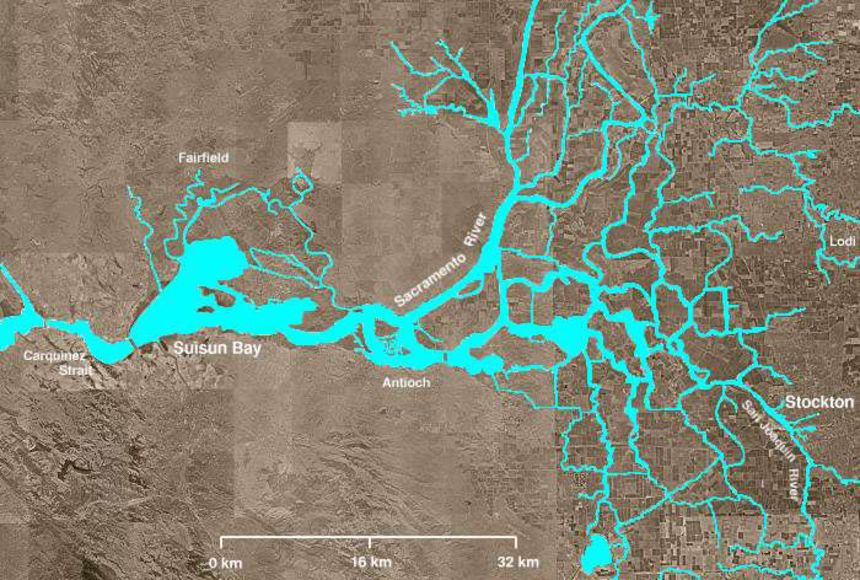
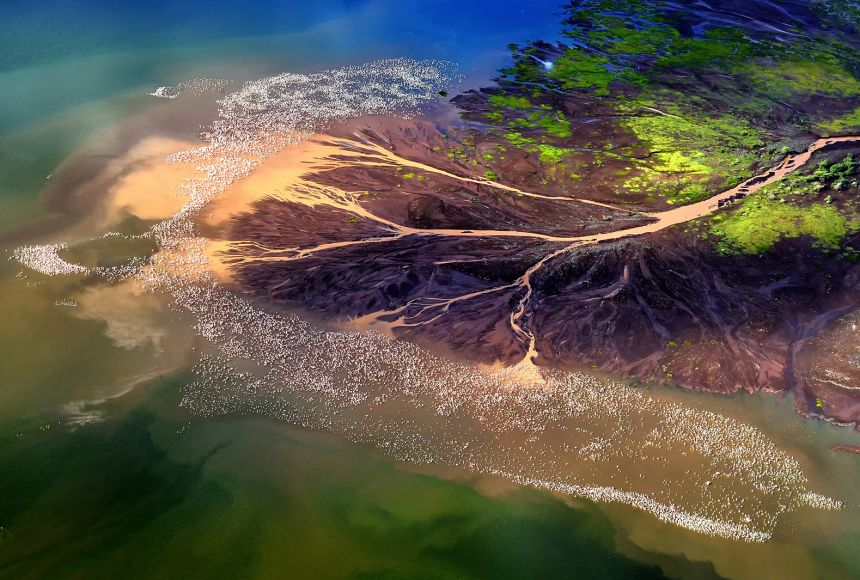
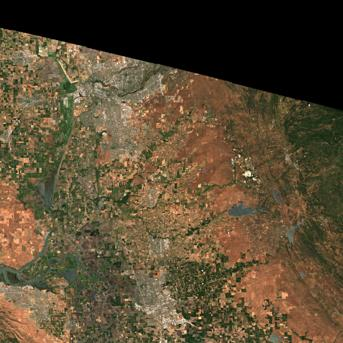
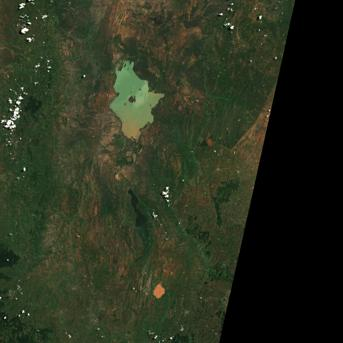

# Coding Preparation

In [ ]:
# Import google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Rasterio**: This library is fundamental for reading and writing raster dataset formats, which is how satellite imagery is typically stored. It allows you to open, inspect, and manipulate the pixel data from the Sentinel-2 tiles.

In [ ]:
# Install using packages
! pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 93.7 MB/s eta 0:00:00


**netCDF4**: This library is used for working with NetCDF files. While Sentinel-2 data is often distributed in other formats (like SAFE, which contains GeoTIFFs), netCDF4 is a common library in atmospheric and oceanic sciences and might be needed for handling certain types of geospatial data or metadata.

In [ ]:
! pip install netCDF4

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 42.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 8.0 MB/s eta 0:00:00


In [ ]:
# Import Required Libraries

import rasterio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import seaborn as sns
import cv2

Data Path Configuration

In [ ]:
# Sacramento Delta region data path
sd_base_path = "/content/drive/MyDrive/final/S2C_MSIL2A_20250518T184931_N0511_R113_T10SFH_20250518T214811.SAFE"

# Loburu Delta region data path
ld_base_path = "/content/drive/MyDrive/final/S2B_MSIL2A_20250515T074609_N0511_R135_T36NZF_20250515T101027.SAFE"

# NDWI & NDVI Analysis


*   **Normalized Difference Water Index (NDWI)**, particularly the one proposed by McFeeters in 1996, is designed to delineate open water features and monitor their changes. It leverages the difference in reflectivity of water in the Green and Near-Infrared (NIR) parts of the spectrum.
*   For Sentinel-2 imagery, it specifically mentions using Band 3 (Green) and Band 8 (NIR)
*   The formula is: $$\text{NDWI} = \frac{\text{Green} - \text{NIR}}{\text{Green} + \text{NIR}}$$

*   **Normalized Difference Vegetation Index (NDVI)** is a standard metric to quantify vegetation health and density. It relies on how plants differentially reflect Red and Near-Infrared (NIR) light.
*   Using Sentinel-2's Band 4 (Red) and Band 8 (NIR) and applies the standard NDVI formula.
*   The formula is: $$\text{NDVI} = \frac{\text{NIR} - \text{Red}}{\text{NIR} + \text{Red}}$$









Part 1.0: Sacramento Delta Region - NDWI Analysis

By using a threshold of 0.0. Pixels with NDWI > 0.0 are classified as water (value 1).

Starting NDWI water detection analysis for Sacramento Delta region
Reading band data for Sacramento Delta region...
Calculating NDWI...


<ipython-input-6-cd6e9c361c83>:30: RuntimeWarning: invalid value encountered in divide
  sd_ndwi = (sd_green_band-sd_nir_band)/(sd_green_band+sd_nir_band)


Generating NDWI visualization results...


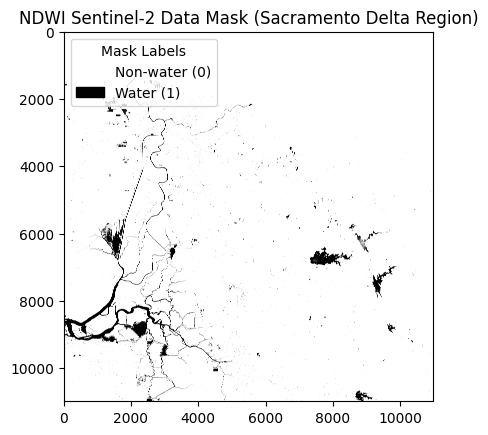

In [ ]:
# Sacramento Delta Region - NDWI Analysis

print("="*60)
print("Starting NDWI water detection analysis for Sacramento Delta region")
print("="*60)

# Define band paths (10m resolution)
sd_bands_paths = {
    'B8': sd_base_path + '/GRANULE/L2A_T10SFH_A003658_20250518T190400/IMG_DATA/R10m/T10SFH_20250518T184931_B08_10m.jp2',  # Near-infrared band
    'B3': sd_base_path + '/GRANULE/L2A_T10SFH_A003658_20250518T190400/IMG_DATA/R10m/T10SFH_20250518T184931_B03_10m.jp2',  # Green band
}

# Read and stack band images
print("Reading band data for Sacramento Delta region...")
sd_band_data = []
for band in ['B3', 'B8']:
    with rasterio.open(sd_bands_paths[band]) as src:
        sd_band_data.append(src.read(1))

# Stack bands and create valid data mask
sd_band_stack = np.dstack(sd_band_data)
sd_valid_data_mask = np.all(sd_band_stack > 0, axis=2)

# Calculate NDWI (Normalized Difference Water Index)
print("Calculating NDWI...")
sd_green_band = sd_band_stack[:,:,0].astype(np.float16)
sd_nir_band = sd_band_stack[:,:,1].astype(np.float16)

# NDWI = (Green - NIR) / (Green + NIR)
sd_ndwi = (sd_green_band-sd_nir_band)/(sd_green_band+sd_nir_band)

# NDWI threshold segmentation
threshold = 0.0  # Threshold setting
sd_mask_ndwi = np.where(sd_ndwi > threshold, 1, 0).astype(np.uint8)

# Visualization results
print("Generating NDWI visualization results...")
# Create legend
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.binary(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.binary(0.99)),
]
labels = ['Non-water (0)', 'Water (1)']
plt.legend(patches, labels, loc='upper left', title='Mask Labels')

# Display results
plt.imshow(sd_mask_ndwi, cmap='binary')
plt.title('NDWI Sentinel-2 Data Mask (Sacramento Delta Region)')
plt.show()

Part 1.1: Sacramento Delta Region - NDVI Analysis

By using an NDVI threshold of 0.3. Pixels with NDVI > 0.3 are classified as vegetation (value 1).

Starting NDVI vegetation detection analysis for Sacramento Delta region
Reading band data for NDVI calculation...
Calculating NDVI...


<ipython-input-7-dcfbda69abb1>:30: RuntimeWarning: invalid value encountered in divide
  sd_ndvi = (sd_nir_band_ndvi - sd_red_band) / (sd_nir_band_ndvi + sd_red_band)


Generating NDVI visualization results...


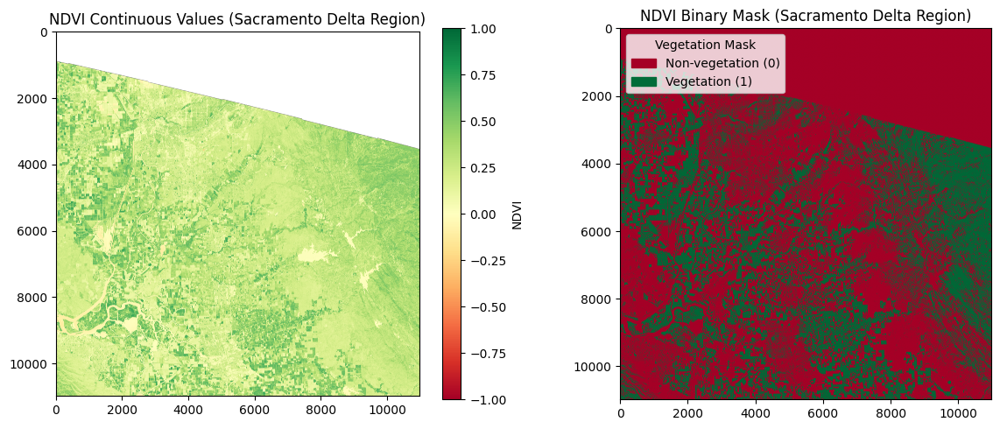

In [ ]:
# Sacramento Delta Region - NDVI Analysis

print("="*60)
print("Starting NDVI vegetation detection analysis for Sacramento Delta region")
print("="*60)

# Define band paths for NDVI (10m resolution)
sd_bands_paths_ndvi = {
    'B8': sd_base_path + '/GRANULE/L2A_T10SFH_A003658_20250518T190400/IMG_DATA/R10m/T10SFH_20250518T184931_B08_10m.jp2',  # Near-infrared band
    'B4': sd_base_path + '/GRANULE/L2A_T10SFH_A003658_20250518T190400/IMG_DATA/R10m/T10SFH_20250518T184931_B04_10m.jp2',  # Red band
}

# Read and stack band images for NDVI
print("Reading band data for NDVI calculation...")
sd_band_data_ndvi = []
for band in ['B4', 'B8']:
    with rasterio.open(sd_bands_paths_ndvi[band]) as src:
        sd_band_data_ndvi.append(src.read(1))

# Stack bands and create valid data mask
sd_band_stack_ndvi = np.dstack(sd_band_data_ndvi)
sd_valid_data_mask_ndvi = np.all(sd_band_stack_ndvi > 0, axis=2)

# Calculate NDVI (Normalized Difference Vegetation Index)
print("Calculating NDVI...")
sd_red_band = sd_band_stack_ndvi[:,:,0].astype(np.float16)
sd_nir_band_ndvi = sd_band_stack_ndvi[:,:,1].astype(np.float16)

# NDVI = (NIR - Red) / (NIR + Red)
sd_ndvi = (sd_nir_band_ndvi - sd_red_band) / (sd_nir_band_ndvi + sd_red_band)

# NDVI threshold segmentation (vegetation typically > 0.3)
ndvi_threshold = 0.3  # Vegetation threshold
sd_mask_ndvi = np.where(sd_ndvi > ndvi_threshold, 1, 0).astype(np.uint8)

# Visualization results
print("Generating NDVI visualization results...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# NDVI continuous values
im1 = ax1.imshow(sd_ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
ax1.set_title('NDVI Continuous Values (Sacramento Delta Region)')
plt.colorbar(im1, ax=ax1, label='NDVI')

# NDVI binary mask
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.RdYlGn(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.RdYlGn(0.99)),
]
labels = ['Non-vegetation (0)', 'Vegetation (1)']
ax2.legend(patches, labels, loc='upper left', title='Vegetation Mask')
ax2.imshow(sd_mask_ndvi, cmap='RdYlGn')
ax2.set_title('NDVI Binary Mask (Sacramento Delta Region)')

plt.tight_layout()
plt.show()

Part 1.2: Sacramento Delta Region - Combined NDVI and NDWI Analysis

**For Water Detection:** Requiring NDWI > 0 (strong water signal as per EOS.com) and NDVI < 0.3 (weak or no vegetation signal as per GISGeography.com) helps refine water classification. It can prevent misclassifying highly reflective moist soil or very sparse/aquatic vegetation as open water if those surfaces happen to have slightly positive NDWI but also higher NDVI.

**For Vegetation Detection:** Requiring NDVI > 0.3 (strong vegetation signal) and NDWI < 0 (strong non-water signal) helps ensure you are mapping terrestrial vegetation and not, for instance, dense mats of aquatic vegetation that might show positive NDWI and positive NDVI.


Sacramento Delta Region: Combined NDVI and NDWI Analysis
Creating combined NDVI-NDWI classification...
Generating combined NDVI-NDWI visualization...


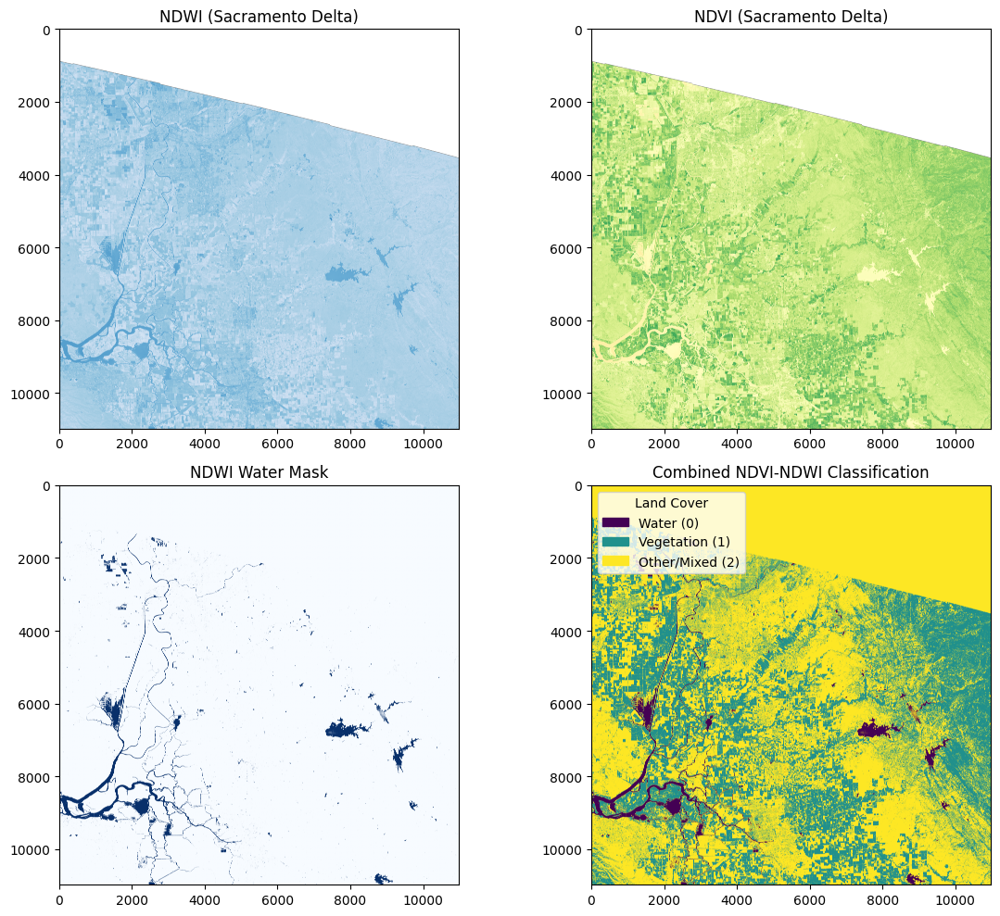

In [ ]:
# Sacramento Delta Region - Combined NDVI and NDWI Analysis

print("="*60)
print("Sacramento Delta Region: Combined NDVI and NDWI Analysis")
print("="*60)

# Create combined classification
# 0: Water (high NDWI, low NDVI)
# 1: Vegetation (low NDWI, high NDVI)
# 2: Other/Mixed (low NDWI, low NDVI or intermediate values)
print("Creating combined NDVI-NDWI classification...")

sd_combined_mask = np.zeros_like(sd_ndwi, dtype=np.uint8)

# Water: NDWI > 0 and NDVI < 0.3
water_mask = (sd_ndwi > 0) & (sd_ndvi < 0.3)
sd_combined_mask[water_mask] = 0

# Vegetation: NDVI > 0.3 and NDWI < 0
vegetation_mask = (sd_ndvi > 0.3) & (sd_ndwi < 0)
sd_combined_mask[vegetation_mask] = 1

# Mixed/Other: everything else
other_mask = ~(water_mask | vegetation_mask)
sd_combined_mask[other_mask] = 2

# Visualization of combined analysis
print("Generating combined NDVI-NDWI visualization...")
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 10))

# Individual indices
ax1.imshow(sd_ndwi, cmap='Blues', vmin=-1, vmax=1)
ax1.set_title('NDWI (Sacramento Delta)')

ax2.imshow(sd_ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
ax2.set_title('NDVI (Sacramento Delta)')

# Binary masks
ax3.imshow(sd_mask_ndwi, cmap='Blues')
ax3.set_title('NDWI Water Mask')

ax4.imshow(sd_combined_mask, cmap='viridis')
ax4.set_title('Combined NDVI-NDWI Classification')

# Add legend for combined classification
patches_combined = [
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0.5)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(1.0)),
]
labels_combined = ['Water (0)', 'Vegetation (1)', 'Other/Mixed (2)']
ax4.legend(patches_combined, labels_combined, loc='upper left', title='Land Cover')

plt.tight_layout()
plt.show()

Part 2.0: Loburu Delta Region - NDWI Analysis

Starting NDWI water detection analysis for Loburu Delta region
Reading band data for Loburu Delta region...
Calculating NDWI...


<ipython-input-9-44b971b21670>:28: RuntimeWarning: invalid value encountered in divide
  ld_ndwi = (ld_green_band-ld_nir_band)/(ld_green_band+ld_nir_band)


Generating NDWI visualization results...


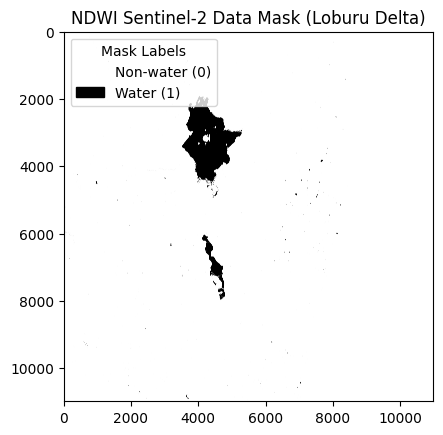

In [ ]:
# Loburu Delta Region - NDWI Analysis

print("="*60)
print("Starting NDWI water detection analysis for Loburu Delta region")
print("="*60)

# Define band paths (10m resolution)
ld_bands_paths = {
    'B8': ld_base_path + '/GRANULE/L2A_T36NZF_A042775_20250515T080630/IMG_DATA/R10m/T36NZF_20250515T074609_B08_10m.jp2',  # Near-infrared band
    'B3': ld_base_path + '/GRANULE/L2A_T36NZF_A042775_20250515T080630/IMG_DATA/R10m/T36NZF_20250515T074609_B03_10m.jp2',  # Green band
}

# Read and stack band images
print("Reading band data for Loburu Delta region...")
ld_band_data = []
for band in ['B3', 'B8']:
    with rasterio.open(ld_bands_paths[band]) as src:
        ld_band_data.append(src.read(1))

# Stack bands
ld_band_stack = np.dstack(ld_band_data)

# Calculate NDWI
print("Calculating NDWI...")
ld_green_band = ld_band_stack[:,:,0].astype(np.float16)
ld_nir_band = ld_band_stack[:,:,1].astype(np.float16)

ld_ndwi = (ld_green_band-ld_nir_band)/(ld_green_band+ld_nir_band)

# NDWI threshold segmentation
threshold = 0.0  # Threshold setting
ld_mask_ndwi = np.where(ld_ndwi > threshold, 1, 0).astype(np.uint8)

# Visualization results
print("Generating NDWI visualization results...")
# Create legend
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.binary(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.binary(0.99)),
]
labels = ['Non-water (0)', 'Water (1)']
plt.legend(patches, labels, loc='upper left', title='Mask Labels')

# Display results
plt.imshow(ld_mask_ndwi, cmap='binary')
plt.title('NDWI Sentinel-2 Data Mask (Loburu Delta)')
plt.show()

Part 2.1: Loburu Delta Region - NDVI Analysis

Starting NDVI vegetation detection analysis for Loburu Delta region
Reading band data for NDVI calculation...
Calculating NDVI...


<ipython-input-10-a219a613ebc4>:30: RuntimeWarning: invalid value encountered in divide
  ld_ndvi = (ld_nir_band_ndvi - ld_red_band) / (ld_nir_band_ndvi + ld_red_band)


Generating NDVI visualization results...


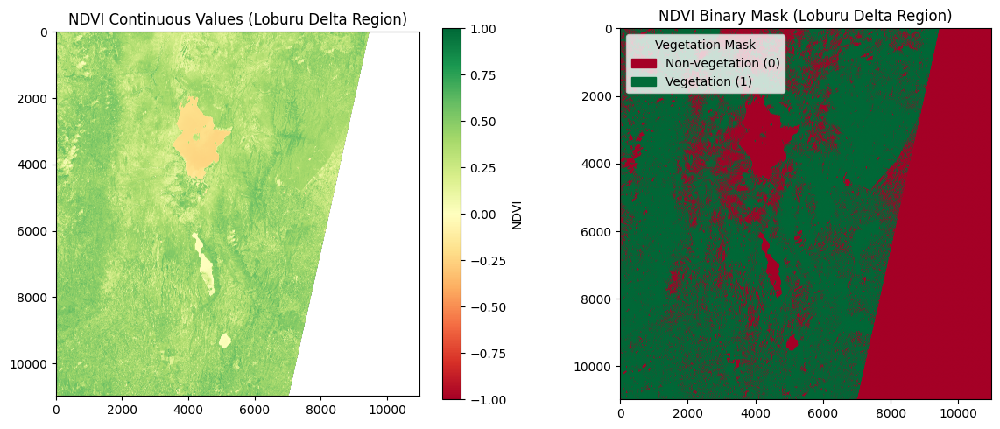

In [ ]:
# Loburu Delta Region - NDVI Analysis

print("="*60)
print("Starting NDVI vegetation detection analysis for Loburu Delta region")
print("="*60)

# Define band paths for NDVI (10m resolution)
ld_bands_paths_ndvi = {
    'B8': ld_base_path + '/GRANULE/L2A_T36NZF_A042775_20250515T080630/IMG_DATA/R10m/T36NZF_20250515T074609_B08_10m.jp2',  # Near-infrared band
    'B4': ld_base_path + '/GRANULE/L2A_T36NZF_A042775_20250515T080630/IMG_DATA/R10m/T36NZF_20250515T074609_B04_10m.jp2',  # Red band
}

# Read and stack band images for NDVI
print("Reading band data for NDVI calculation...")
ld_band_data_ndvi = []
for band in ['B4', 'B8']:
    with rasterio.open(ld_bands_paths_ndvi[band]) as src:
        ld_band_data_ndvi.append(src.read(1))

# Stack bands and create valid data mask
ld_band_stack_ndvi = np.dstack(ld_band_data_ndvi)
ld_valid_data_mask_ndvi = np.all(ld_band_stack_ndvi > 0, axis=2)

# Calculate NDVI (Normalized Difference Vegetation Index)
print("Calculating NDVI...")
ld_red_band = ld_band_stack_ndvi[:,:,0].astype(np.float16)
ld_nir_band_ndvi = ld_band_stack_ndvi[:,:,1].astype(np.float16)

# NDVI = (NIR - Red) / (NIR + Red)
ld_ndvi = (ld_nir_band_ndvi - ld_red_band) / (ld_nir_band_ndvi + ld_red_band)

# NDVI threshold segmentation (vegetation typically > 0.3)
ndvi_threshold = 0.3  # Vegetation threshold
ld_mask_ndvi = np.where(ld_ndvi > ndvi_threshold, 1, 0).astype(np.uint8)

# Visualization results
print("Generating NDVI visualization results...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# NDVI continuous values
im1 = ax1.imshow(ld_ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
ax1.set_title('NDVI Continuous Values (Loburu Delta Region)')
plt.colorbar(im1, ax=ax1, label='NDVI')

# NDVI binary mask
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.RdYlGn(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.RdYlGn(0.99)),
]
labels = ['Non-vegetation (0)', 'Vegetation (1)']
ax2.legend(patches, labels, loc='upper left', title='Vegetation Mask')
ax2.imshow(ld_mask_ndvi, cmap='RdYlGn')
ax2.set_title('NDVI Binary Mask (Loburu Delta Region)')

plt.tight_layout()
plt.show()

Part 2.2: Loburu Delta Region - Combined NDVI and NDWI Analysis

Loburu Delta Region: Combined NDVI and NDWI Analysis
Creating combined NDVI-NDWI classification...
Generating combined NDVI-NDWI visualization...


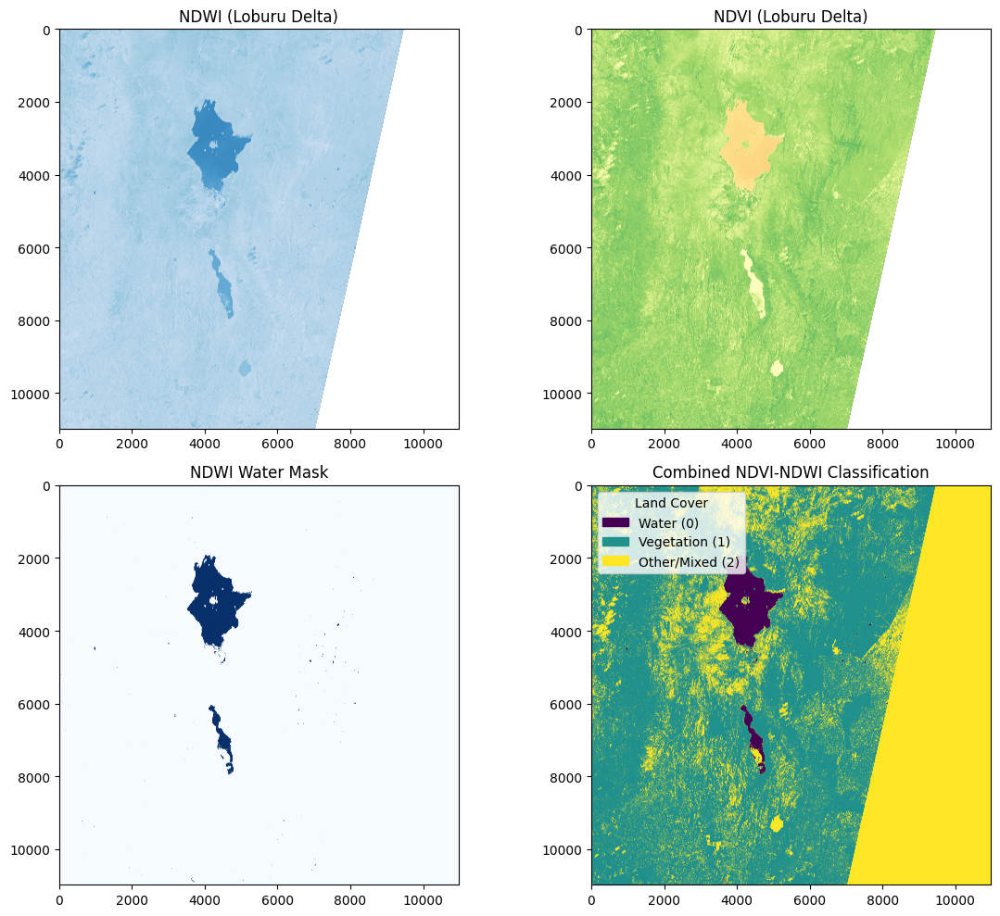

In [ ]:
# Loburu Delta Region - Combined NDVI and NDWI Analysis

print("="*60)
print("Loburu Delta Region: Combined NDVI and NDWI Analysis")
print("="*60)

# Create combined classification
# 0: Water (high NDWI, low NDVI)
# 1: Vegetation (low NDWI, high NDVI)
# 2: Other/Mixed (low NDWI, low NDVI or intermediate values)
print("Creating combined NDVI-NDWI classification...")

ld_combined_mask = np.zeros_like(ld_ndwi, dtype=np.uint8)

# Water: NDWI > 0 and NDVI < 0.3
water_mask_m = (ld_ndwi > 0) & (ld_ndvi < 0.3)
ld_combined_mask[water_mask_m] = 0

# Vegetation: NDVI > 0.3 and NDWI < 0
vegetation_mask_m = (ld_ndvi > 0.3) & (ld_ndwi < 0)
ld_combined_mask[vegetation_mask_m] = 1

# Mixed/Other: everything else
other_mask_m = ~(water_mask_m | vegetation_mask_m)
ld_combined_mask[other_mask_m] = 2

# Visualization of combined analysis
print("Generating combined NDVI-NDWI visualization...")
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 10))

# Individual indices
ax1.imshow(ld_ndwi, cmap='Blues', vmin=-1, vmax=1)
ax1.set_title('NDWI (Loburu Delta)')

ax2.imshow(ld_ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
ax2.set_title('NDVI (Loburu Delta)')

# Binary masks
ax3.imshow(ld_mask_ndwi, cmap='Blues')
ax3.set_title('NDWI Water Mask')

ax4.imshow(ld_combined_mask, cmap='viridis')
ax4.set_title('Combined NDVI-NDWI Classification')

# Add legend for combined classification
patches_combined = [
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0.5)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(1.0)),
]
labels_combined = ['Water (0)', 'Vegetation (1)', 'Other/Mixed (2)']
ax4.legend(patches_combined, labels_combined, loc='upper left', title='Land Cover')

plt.tight_layout()
plt.show()

# K-means Clustering Analysis
K-means clustering is an unsupervised machine learning algorithm used to partition a dataset into a pre-defined number of distinct, non-overlapping subgroups (clusters), denoted by 'K'. The "unsupervised" part means it learns patterns from unlabeled data—you don't need to tell it beforehand which pixel is water or vegetation.

Part 3.0: Sacramento Delta Region - K-means Clustering Analysis (Green and NIR bands)

This part applies K-means clustering using the Green (B3) and Near-Infrared (B8) bands – the same bands used for calculating the McFeeters NDWI.

Starting K-means clustering analysis for Sacramento Delta region (B3 and B8 bands)
Reading band data...
Displaying individual bands...


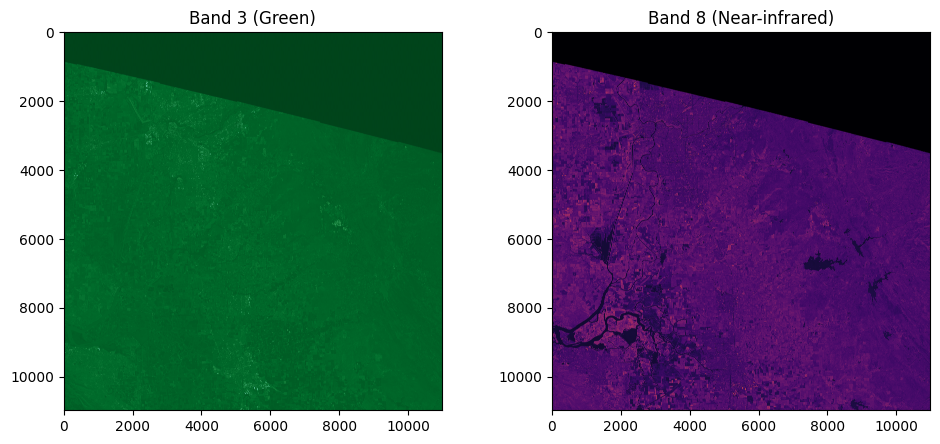

Performing K-means clustering...
Displaying K-means clustering results...


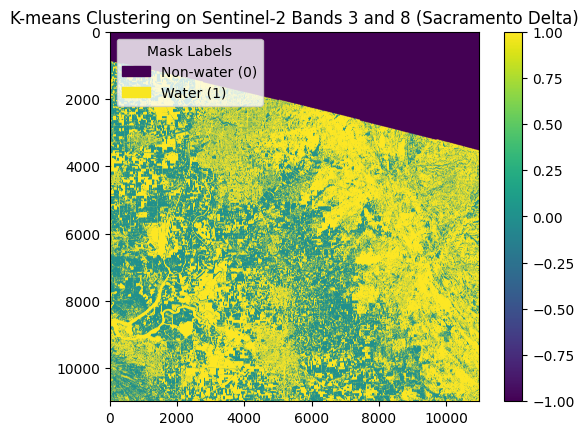

In [ ]:
# Sacramento Delta Region - K-means Clustering Analysis (Green and NIR bands)

print("="*60)
print("Starting K-means clustering analysis for Sacramento Delta region (B3 and B8 bands)")
print("="*60)

# Redefine band paths for clarity
sd_bands_paths_kmeans = {
    'B8': sd_base_path + '/GRANULE/L2A_T10SFH_A003658_20250518T190400/IMG_DATA/R10m/T10SFH_20250518T184931_B08_10m.jp2',
    'B3': sd_base_path + '/GRANULE/L2A_T10SFH_A003658_20250518T190400/IMG_DATA/R10m/T10SFH_20250518T184931_B03_10m.jp2'
}

# Read and stack band images
print("Reading band data...")
sd_band_data_kmeans = []
for band in ['B3', 'B8']:
    with rasterio.open(sd_bands_paths_kmeans[band]) as src:
        sd_band_data_kmeans.append(src.read(1))

# Stack bands and create valid data mask
sd_band_stack_kmeans = np.dstack(sd_band_data_kmeans)
sd_valid_data_mask_kmeans = np.all(sd_band_stack_kmeans > 0, axis=2)

# Band visualization
print("Displaying individual bands...")
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(sd_band_stack_kmeans[:,:,0], cmap='BuGn_r')
ax1.set_title('Band 3 (Green)')

ax2.imshow(sd_band_stack_kmeans[:,:,1], cmap='inferno')
ax2.set_title('Band 8 (Near-infrared)')

plt.tight_layout()
fig.set_size_inches(10, 5)
plt.show()

# K-means clustering
print("Performing K-means clustering...")
# Reshape data for K-means, including only valid data
sd_X = sd_band_stack_kmeans[sd_valid_data_mask_kmeans].reshape((-1, 2))

# K-means clustering (2 clusters)
sd_kmeans = KMeans(n_clusters=2, random_state=0).fit(sd_X)
sd_labels = sd_kmeans.labels_

# Create result array
sd_labels_image_traditional = np.full(sd_band_stack_kmeans.shape[:2], -1, dtype=int)
sd_labels_image_traditional[sd_valid_data_mask_kmeans] = sd_labels

# Result visualization
print("Displaying K-means clustering results...")
# Create legend
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0.99)),
]
labels = ['Non-water (0)', 'Water (1)']
plt.legend(patches, labels, loc='upper left', title='Mask Labels')

# Display image
plt.imshow(sd_labels_image_traditional, cmap='viridis')
plt.title('K-means Clustering on Sentinel-2 Bands 3 and 8 (Sacramento Delta)')
plt.colorbar()
plt.show()


Part 3.1: Sacramento Delta Region - SWI Band K-means Clustering Analysis (B5 and B11)

This part uses K-means clustering with Sentinel-2 Band 5 (Vegetation Red Edge) and Band 11 (SWIR1). These bands are known to be sensitive to moisture content and are often used in more advanced water indices. Note that these bands are at 20m resolution.

**SWI**: an index has better performance in separating urban areas, sediment, salt, and ice from water bodies, and its extraction accuracy is higher than NDWI. It is supposed as an efficient Sentinel-2 water extraction index with potential for automatic, large-scale water body mapping.


*   Formula: $$\text{SWI} = \frac{\text{Red} - \text{SWIR}}{\text{Red} + \text{SWIR}}$$



Starting SWIR band K-means clustering analysis for Sacramento Delta region (B5 and B11 bands)
Reading SWIR band data...
Displaying SWIR bands...


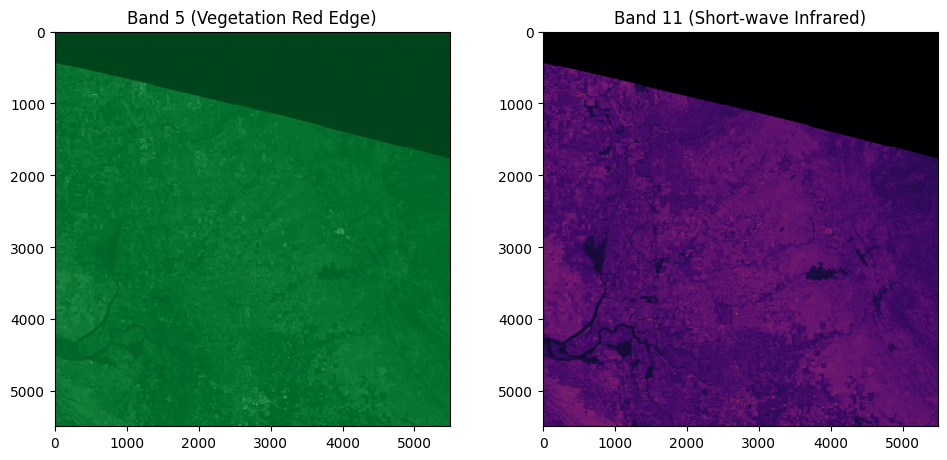

Performing SWIR band K-means clustering...
Displaying SWIR K-means clustering results...


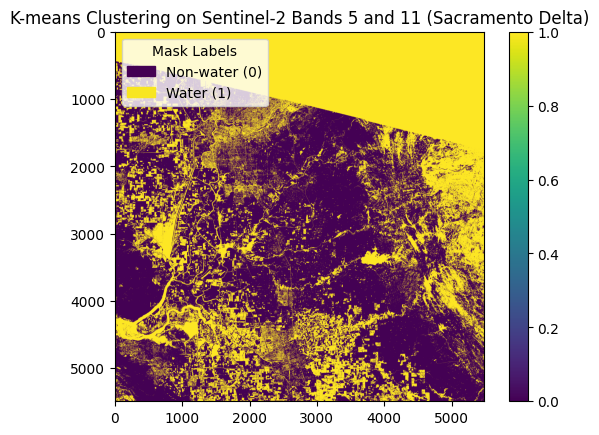

In [ ]:
# Sacramento Delta Region - SWI Band K-means Clustering Analysis (B5 and B11)

print("="*60)
print("Starting SWI band K-means clustering analysis for Sacramento Delta region (B5 and B11 bands)")
print("="*60)

# Define SWI band paths (20m resolution)
sd_bands_paths_swi = {
    'B5': sd_base_path + '/GRANULE/L2A_T10SFH_A003658_20250518T190400/IMG_DATA/R20m/T10SFH_20250518T184931_B05_20m.jp2',
    'B11': sd_base_path + '/GRANULE/L2A_T10SFH_A003658_20250518T190400/IMG_DATA/R20m/T10SFH_20250518T184931_B11_20m.jp2'
}

# Read and stack band images
print("Reading SWI band data...")
sd_band_data_swi = []
for band in ['B5', 'B11']:
    with rasterio.open(sd_bands_paths_swi[band]) as src:
        sd_band_data_swi.append(src.read(1))

# Stack bands and create valid data mask
sd_band_stack_swi = np.dstack(sd_band_data_swi)
sd_valid_data_mask_swi = np.all(sd_band_stack_swi > 0, axis=2)

# Visualization of bands used
print("Displaying SWI bands...")
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(sd_band_stack_swi[:,:,0], cmap='BuGn_r')
ax1.set_title('Band 5 (Vegetation Red Edge)')

ax2.imshow(sd_band_stack_swi[:,:,1], cmap='inferno')
ax2.set_title('Band 11 (Short-wave Infrared)')

plt.tight_layout()
fig.set_size_inches(10, 5)
plt.show()

# K-means clustering
print("Performing SWI band K-means clustering...")
# Reshape data for K-means
sd_X_swi = sd_band_stack_swi[sd_valid_data_mask_swi].reshape((-1, 2))

# K-means clustering (3 clusters)
sd_kmeans_swi = KMeans(n_clusters=3, random_state=0).fit(sd_X_swi)
sd_labels_swi = sd_kmeans_swi.labels_

# Create result array
sd_labels_image_swi = np.full(sd_band_stack_swi.shape[:2], -1, dtype=int)
sd_labels_image_swi[sd_valid_data_mask_swi] = sd_labels_swi

# Simplify labels to have only water and non-water
sd_labels_image_swi_flattened = np.where(sd_labels_image_swi >= 1, 0, 1)

# Result visualization
print("Displaying SWI K-means clustering results...")
# Create legend
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0.99)),
]
labels = ['Non-water (0)', 'Water (1)']
plt.legend(patches, labels, loc='upper left', title='Mask Labels')

# Display image
plt.imshow(sd_labels_image_swi_flattened, cmap='viridis')
plt.title('K-means Clustering on Sentinel-2 Bands 5 and 11 (Sacramento Delta)')
plt.colorbar()
plt.show()


Part 3.2: Sacramento Delta Region - NDVI-NDWI K-means Clustering Analysis

This part uses the previously calculated NDVI and NDWI images as input features for K-means clustering. This is a powerful approach because NDVI and NDWI are already processed data that highlight specific characteristics (vegetation and water).

Starting NDVI-NDWI combined K-means clustering analysis for Sacramento Delta region
Preparing NDVI and NDWI data for clustering...
Performing K-means clustering on NDVI-NDWI features...
Cluster centers (NDVI, NDWI):
Cluster 0: NDVI=0.485, NDWI=-0.460
Cluster 1: NDVI=0.250, NDWI=-0.320
Cluster 2: NDVI=0.080, NDWI=-0.116
Displaying NDVI-NDWI K-means clustering results...


<ipython-input-14-a670c48b6e96>:58: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


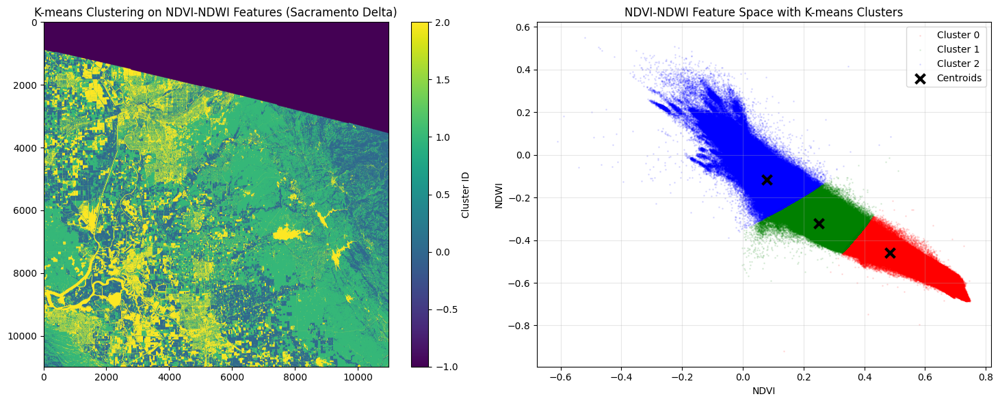

In [ ]:
# Sacramento Delta Region - NDVI-NDWI K-means Clustering Analysis

print("="*60)
print("Starting NDVI-NDWI combined K-means clustering analysis for Sacramento Delta region")
print("="*60)

# Prepare NDVI and NDWI data for K-means clustering
print("Preparing NDVI and NDWI data for clustering...")

# Create valid data mask (where both indices are valid)
sd_valid_indices_mask = np.isfinite(sd_ndvi) & np.isfinite(sd_ndwi)

# Stack NDVI and NDWI as features
sd_indices_stack = np.dstack([sd_ndvi, sd_ndwi])

# K-means clustering on NDVI-NDWI feature space
print("Performing K-means clustering on NDVI-NDWI features...")
# Reshape data for K-means, including only valid data
sd_X_indices = sd_indices_stack[sd_valid_indices_mask].reshape((-1, 2))

# K-means clustering (3 clusters for water, vegetation, other)
sd_kmeans_indices = KMeans(n_clusters=3, random_state=0).fit(sd_X_indices)
sd_labels_indices = sd_kmeans_indices.labels_

# Create result array
sd_labels_image_indices = np.full(sd_indices_stack.shape[:2], -1, dtype=int)
sd_labels_image_indices[sd_valid_indices_mask] = sd_labels_indices

# Analyze cluster centers to determine which cluster represents what
cluster_centers = sd_kmeans_indices.cluster_centers_
print("Cluster centers (NDVI, NDWI):")
for i, center in enumerate(cluster_centers):
    print(f"Cluster {i}: NDVI={center[0]:.3f}, NDWI={center[1]:.3f}")

# Result visualization
print("Displaying NDVI-NDWI K-means clustering results...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Clustering result
im1 = ax1.imshow(sd_labels_image_indices, cmap='viridis')
ax1.set_title('K-means Clustering on NDVI-NDWI Features (Sacramento Delta)')
plt.colorbar(im1, ax=ax1, label='Cluster ID')

# Scatter plot of feature space with cluster colors
colors = ['red', 'green', 'blue']
for i in range(3):
    cluster_mask = sd_labels_indices == i
    cluster_data = sd_X_indices[cluster_mask]
    ax2.scatter(cluster_data[:, 0], cluster_data[:, 1], c=colors[i], alpha=0.1, s=1, label=f'Cluster {i}')

ax2.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='black', marker='x', s=100, linewidths=3, label='Centroids')
ax2.set_xlabel('NDVI')
ax2.set_ylabel('NDWI')
ax2.set_title('NDVI-NDWI Feature Space with K-means Clusters')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Part 3.3: Sacramento Delta Region - Method Comparison

This section provides side-by-side visual comparisons of the water masks generated by different methods.

Sacramento Delta Region: NDWI vs K-means Method Comparison
Displaying NDWI vs Traditional K-means method comparison...


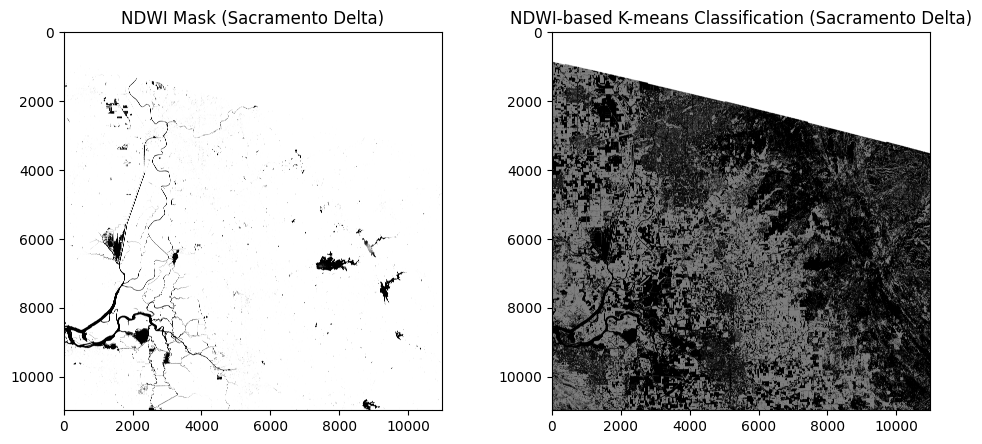

Displaying NDWI vs SWIR K-means method comparison...


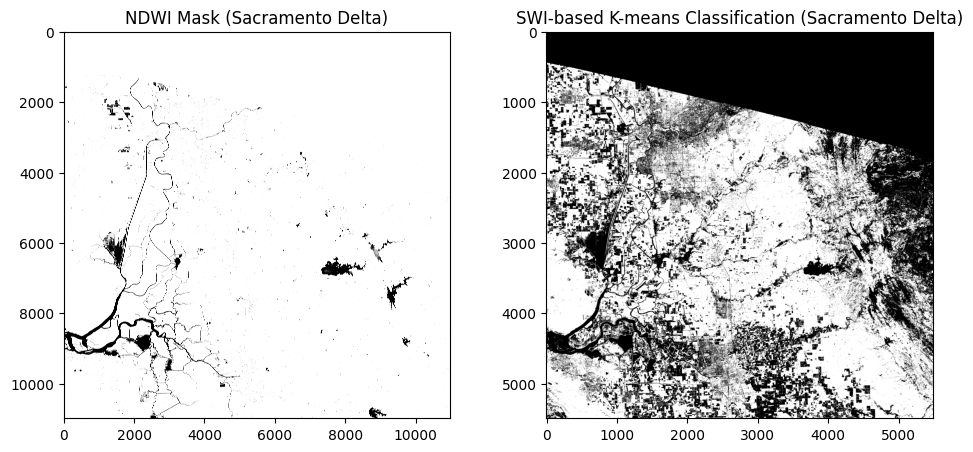

In [ ]:
# Sacramento Delta Region - Method Comparison

print("="*60)
print("Sacramento Delta Region: NDWI vs K-means Method Comparison")
print("="*60)

# NDWI vs Traditional K-means comparison
print("Displaying NDWI vs Traditional K-means method comparison...")
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(sd_mask_ndwi, cmap='binary')
ax1.set_title('NDWI Mask (Sacramento Delta)')

ax2.imshow(sd_labels_image_traditional, cmap='binary')
ax2.set_title('NDWI-based K-means Classification (Sacramento Delta)')

plt.tight_layout()
fig.set_size_inches(10, 5)
plt.show()

# NDWI vs SWI K-means comparison
print("Displaying NDWI vs SWI K-means method comparison...")
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(sd_mask_ndwi, cmap='binary')
ax1.set_title('NDWI Mask (Sacramento Delta)')

ax2.imshow(sd_labels_image_swi_flattened, cmap='binary')
ax2.set_title('SWI-based K-means Classification (Sacramento Delta)')

plt.tight_layout()
fig.set_size_inches(10, 5)
plt.show()

Part 3.4: Sacramento Delta Region - Performance Evaluation

This part quantitatively evaluates the K-means clustering results by comparing them against the NDWI-derived water mask, which is treated as a form of "ground truth" or baseline for this project.

Sacramento Delta Region: Traditional K-means Method Performance Evaluation


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report:
               precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.36      0.52 117649303
           1       0.05      0.98      0.10   2911097

    accuracy                           0.37 120560400
   macro avg       0.35      0.45      0.21 120560400
weighted avg       0.98      0.37      0.51 120560400



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


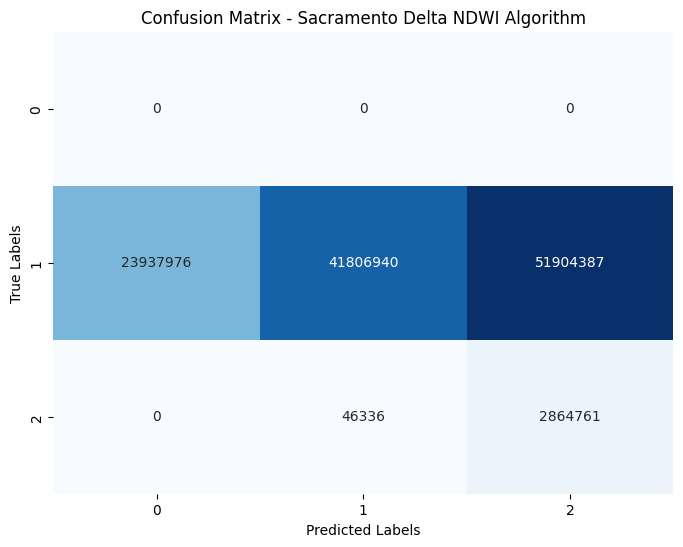

Accuracy: 0.37
Sacramento Delta Region: SWI K-means Method Performance Evaluation
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.56      0.72  29382585
           1       0.05      0.97      0.10    757515

    accuracy                           0.57  30140100
   macro avg       0.53      0.77      0.41  30140100
weighted avg       0.98      0.57      0.70  30140100



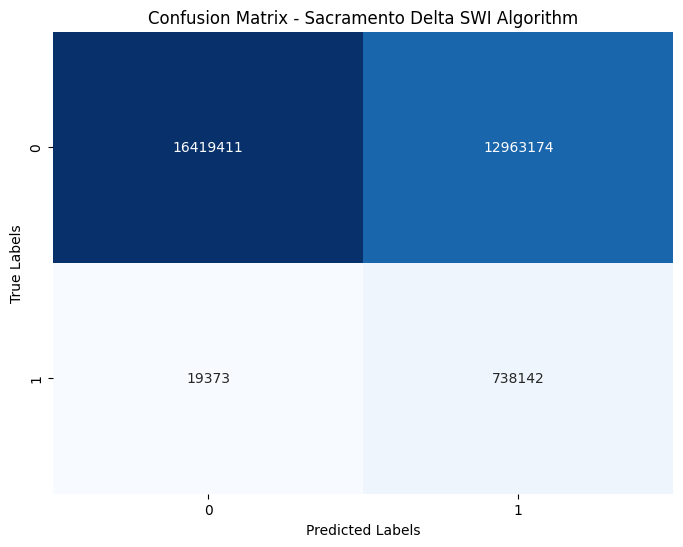

Accuracy: 0.57


In [ ]:
# Sacramento Delta Region - Performance Evaluation

print("="*60)
print("Sacramento Delta Region: Traditional K-means Method Performance Evaluation")
print("="*60)

## Data preprocessing ##
# Retrieve values from NDWI mask (1 = water, 0 = land)
mask_ndwi = sd_mask_ndwi

# Retrieve values from K-means mask (1 = water, 0 = land)
kmeans_results = sd_labels_image_traditional

## Analysis calculations ##
# Flatten 2D arrays
ndwi_baseline = mask_ndwi.flatten()
kmeans_pred = kmeans_results.flatten()

# Compute confusion matrix
cm = confusion_matrix(ndwi_baseline, kmeans_pred)

# Calculate accuracy
accuracy = accuracy_score(ndwi_baseline, kmeans_pred)

# Display classification report
report = classification_report(ndwi_baseline, kmeans_pred)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - Sacramento Delta NDWI Algorithm")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Display accuracy
print(f"Accuracy: {accuracy:.2f}")

print("="*60)
print("Sacramento Delta Region: SWI K-means Method Performance Evaluation")
print("="*60)

## Data preprocessing ##
# Retrieve values from NDWI mask (1 = water, 0 = land)
mask_ndwi_resized = cv2.resize(sd_mask_ndwi, dsize=(5490, 5490))

# Retrieve values from K-means mask (0 = water, 1 = land) -- values need to be flipped
kmeans_results_swi = sd_labels_image_swi_flattened

## Analysis calculations ##
# Flatten 2D arrays
ndwi_baseline_resized = mask_ndwi_resized.flatten()
kmeans_pred_swi = kmeans_results_swi.flatten()

# Compute confusion matrix
cm_swi = confusion_matrix(ndwi_baseline_resized, kmeans_pred_swi)

# Calculate accuracy
accuracy_swi = accuracy_score(ndwi_baseline_resized, kmeans_pred_swi)

# Display classification report
report_swi = classification_report(ndwi_baseline_resized, kmeans_pred_swi)
print("Classification Report:\n", report_swi)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_swi, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - Sacramento Delta SWI Algorithm")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Display accuracy
print(f"Accuracy: {accuracy_swi:.2f}")


Part 4.0: Loburu Delta Region - SWI Band K-means Clustering Analysis

Starting SWIR band K-means clustering analysis for Loburu Delta region
Reading Loburu Delta SWIR band data...
Displaying bands...


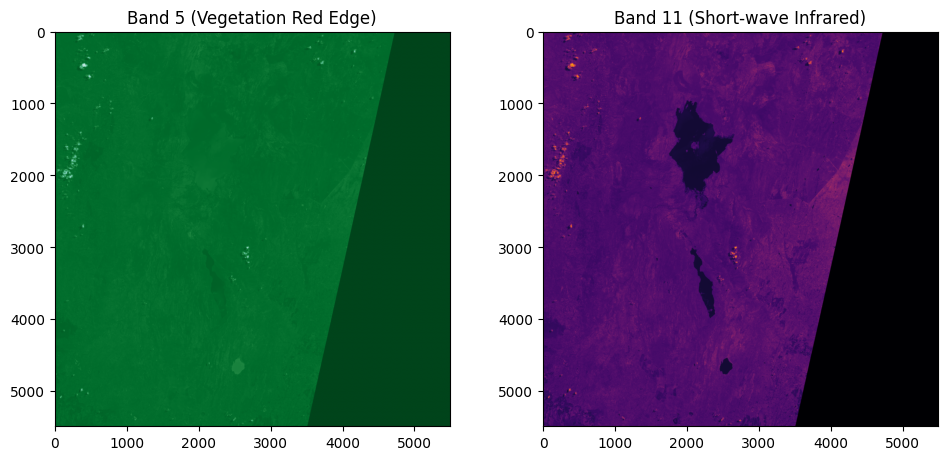

Performing K-means clustering...
Displaying results...


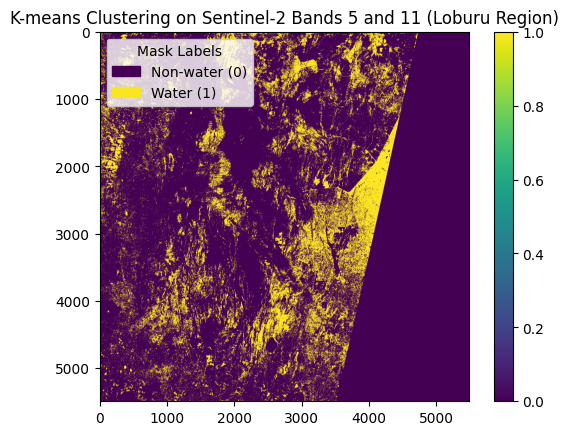

In [ ]:
# Loburu Delta Region - SWI Band K-means Clustering Analysis

print("="*60)
print("Starting SWI band K-means clustering analysis for Loburu Delta region")
print("="*60)

# Define SWI band paths (20m resolution)
ld_bands_paths_swi = {
    'B5': ld_base_path + '/GRANULE/L2A_T36NZF_A042775_20250515T080630/IMG_DATA/R20m/T36NZF_20250515T074609_B05_20m.jp2',
    'B11': ld_base_path + '/GRANULE/L2A_T36NZF_A042775_20250515T080630/IMG_DATA/R20m/T36NZF_20250515T074609_B11_20m.jp2'
}

# Read and stack band images
print("Reading Loburu Delta SWI band data...")
ld_band_data_swi = []
for band in ['B5', 'B11']:
    with rasterio.open(ld_bands_paths_swi[band]) as src:
        ld_band_data_swi.append(src.read(1))

# Stack bands and create valid data mask
ld_band_stack_swi = np.dstack(ld_band_data_swi)
ld_valid_data_mask_swi = np.all(ld_band_stack_swi > 0, axis=2)

# Visual representation of bands
print("Displaying bands...")
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(ld_band_stack_swi[:,:,0], cmap='BuGn_r')
ax1.set_title('Band 5 (Vegetation Red Edge)')

ax2.imshow(ld_band_stack_swi[:,:,1], cmap='inferno')
ax2.set_title('Band 11 (Short-wave Infrared)')

plt.tight_layout()
fig.set_size_inches(10, 5)
plt.show()

# K-means clustering
print("Performing K-means clustering...")
# Reshape data for K-means, including only valid data
ld_X_swi = ld_band_stack_swi[ld_valid_data_mask_swi].reshape((-1, 2))

# K-means clustering
ld_kmeans_swi = KMeans(n_clusters=3, random_state=0).fit(ld_X_swi)
ld_labels_swi = ld_kmeans_swi.labels_

# Create result array
ld_labels_image_swi = np.full(ld_band_stack_swi.shape[:2], -1, dtype=int)
ld_labels_image_swi[ld_valid_data_mask_swi] = ld_labels_swi

# Simplify labels to have only water and non-water
ld_labels_image_swi_flattened = np.where(ld_labels_image_swi != 0, 0, 1)

# Result visualization
print("Displaying results...")
# Create legend
patches = [
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0)),
    Rectangle((0, 0), 1, 1, color=plt.cm.viridis(0.99)),
]
labels = ['Non-water (0)', 'Water (1)']
plt.legend(patches, labels, loc='upper left', title='Mask Labels')

# Display image
plt.imshow(ld_labels_image_swi_flattened, cmap='viridis')
plt.title('K-means Clustering on Sentinel-2 Bands 5 and 11 (Loburu Region)')
plt.colorbar()
plt.show()


Part 4.1: Loburu Delta Region - Method Comparison

Loburu Delta Region: NDWI vs K-means Method Comparison
Displaying Loburu Delta region method comparison...


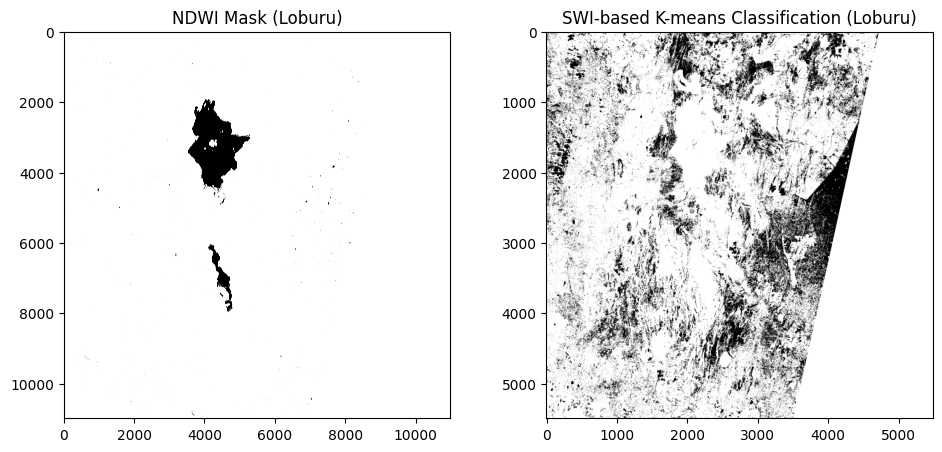

In [ ]:
# Loburu Delta Region - Method Comparison


print("="*60)
print("Loburu Delta Region: NDWI vs K-means Method Comparison")
print("="*60)

print("Displaying Loburu Delta region method comparison...")
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(ld_mask_ndwi, cmap='binary')
ax1.set_title('NDWI Mask (Loburu)')

ax2.imshow(ld_labels_image_swi_flattened, cmap='binary')
ax2.set_title('SWI-based K-means Classification (Loburu)')

plt.tight_layout()
fig.set_size_inches(10, 5)
plt.show()


Part 4.2: Loburu Delta Region - Performance Evaluation

Loburu Delta Region: SWI K-means Method Performance Evaluation
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.84      0.90  29485272
           1       0.00      0.00      0.00    654828

    accuracy                           0.82  30140100
   macro avg       0.49      0.42      0.45  30140100
weighted avg       0.95      0.82      0.88  30140100



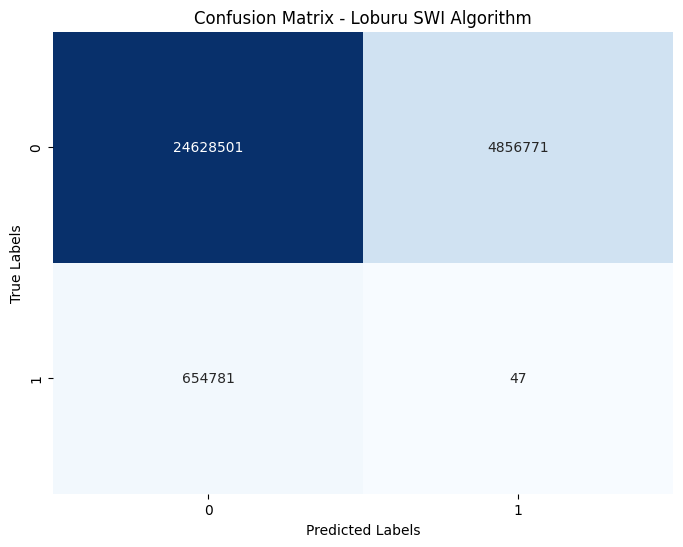

Accuracy: 0.82


In [ ]:
# Loburu Delta Region - Performance Evaluation

print("="*60)
print("Loburu Delta Region: SWI K-means Method Performance Evaluation")
print("="*60)

## Data preprocessing ##
# Retrieve values from NDWI mask (1 = water, 0 = land)
mask_ndwi_resized_m = cv2.resize(ld_mask_ndwi, dsize=(5490, 5490))

# Retrieve values from K-means mask (0 = water, 1 = land) -- values need to be flipped
kmeans_results_m = ld_labels_image_swi_flattened

## Analysis calculations ##
# Flatten 2D arrays
ndwi_baseline_m = mask_ndwi_resized_m.flatten()
kmeans_pred_m = kmeans_results_m.flatten()

# Compute confusion matrix
cm_m = confusion_matrix(ndwi_baseline_m, kmeans_pred_m)

# Calculate accuracy
accuracy_m = accuracy_score(ndwi_baseline_m, kmeans_pred_m)

# Display classification report
report_m = classification_report(ndwi_baseline_m, kmeans_pred_m)
print("Classification Report:\n", report_m)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_m, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - Loburu SWI Algorithm")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

# Display accuracy
print(f"Accuracy: {accuracy_m:.2f}")

# Conclusions

K-means clustering applied to NDWI, NDVI, and specific Sentinel-2 bands (such as B3/B8 and B5/B11) allowed for a more detailed classification of mixed land types. Combining NDWI and NDVI in the feature space improved the separation of water, vegetation, and transitional areas like wetlands and irrigated fields. The use of Band 5 and Band 11 also helped with moisture detection, though performance varied by location.

Regionally, the Sacramento Delta showed strong agreement between NDWI and K-means outputs, with low false positives and clear water mapping. In contrast, in Loburu, while NDWI worked well, the SWI-based and SWIR-band clustering drastically overestimated water areas, with extremely high false positives and almost no correct water detections. This highlights the need for region-specific calibration and caution when using moisture-sensitive indices like SWI.

Finally, the confusion matrices confirmed these findings. In Sacramento, NDWI-based methods achieved high true positive rates with few water omission errors. However, in Loburu, the SWI-based classifier performed poorly, misclassifying many non-water areas as water and failing to detect actual water pixels. Bceause in both regions, the majority of pixels are non-water, which skews the confusion matrix heavily.

# Environmental cost

For **1-hour running time** of the code:

**GPU Power Consumption: Assume the GPU usage averaged 150 Watts over the hour. This means your GPU consumed 0.15 kilowatt-hours (kWh) of IT electricity.

**Embodied Costs (Hardware Manufacturing): The environmental cost to manufacture the GPU, amortized over its lifespan. Using data for a high-end GPU like an NVIDIA H100 as a proxy (as detailed amortized data for all Colab GPUs isn't readily available):

**Embodied Carbon: Approximately 0.013 kg CO2e (carbon dioxide equivalent) for one hour of use.

**Embodied Water: Approximately 0.003 liters for one hour of use.

**Operational Costs (Energy & Carbon):

 1. Power Usage Effectiveness (PUE): Google's average of 1.10.

 2. Carbon Intensity (CI): Let's use the CI for Google's Jupiter, TX data center, which is 0.332 kg CO2e/kWh. The actual CI for your session could be different depending on the data center location and the real-time energy mix.

 3. Operational Carbon Emissions = IT Energy × PUE × CI = 0.15 kWh × 1.10 × 0.332 kg CO2e/kWh = 0.05478 kg CO2e.

**Operational Costs (Water):

 1. Water Usage Effectiveness (WUE) onsite: Assume 0 L/kWh (for efficient closed-loop cooling systems).

 2. WUE offsite (for electricity generation): For the Jupiter, TX location, this is 1.29 L/kWh.

 3. Operational Water Consumption = IT Energy × PUE × (WUE onsite + WUE offsite) = 0.15 kWh × 1.10 × (0 L/kWh + 1.29 L/kWh) = 0.21285 liters.

**Total Carbon Emissions: Embodied Carbon + Operational Carbon = 0.013 kg CO2e + 0.05478 kg CO2e = approximately 0.068 kg CO2e.

**Total Water Consumption: Embodied Water + Operational Water = 0.003 liters + 0.21285 liters = approximately 0.216 liters.

**Reference**:

1. www.esa.int. (n.d.). Facts and figures. [online] Available at: https://www.esa.int/Applications/Observing_the_Earth/Copernicus/Sentinel-2/Facts_and_figures.
2. Copernicus.eu. (2015). S2 Processing. [online] Available at: https://sentiwiki.copernicus.eu/web/s2-processing.
3. Github.io. (2025). Unsupervised Learning — GEOL0069 Guide Book. [online] Available at: https://cpomucl.github.io/GEOL0069-AI4EO/Chapter1_Unsupervised_Learning_Methods_2.html [Accessed 3 Jun. 2025].
4. Orr, J., Gibbons, O. and Arnold, W. (2020). A brief guide to calculating embodied carbon. [online] Available at: https://www.istructe.org/IStructE/media/Public/TSE-Archive/2020/A-brief-guide-to-calculating-embodied-carbon.pdf.
5. Datacenters.google. (2025). Blocked. [online] Available at: https://datacenters.google/efficiency/.
6. Arxiv.org. (2020). Holistically Evaluating the Environmental Impact of Creating Language Models. [online] Available at: https://arxiv.org/html/2503.05804v1 [Accessed 3 Jun. 2025].
7. Ruff, L. (2017). Carbon Intensity. [online] Carbonintensity.org.uk. Available at: https://carbonintensity.org.uk/.
8. Owen, R.A., Owen, R.B., Renaut, R.W., Scott, J.J., Jones, B. and Ashley, G.M. (2008). Mineralogy and origin of rhizoliths on the margins of saline, alkaline Lake Bogoria, Kenya Rift Valley. Sedimentary Geology, 203(1-2), pp.143–163. doi:https://doi.org/10.1016/j.sedgeo.2007.11.007.
9. Evers, J. (2022). Delta | National Geographic Society. [online] education.nationalgeographic.org. Available at: https://education.nationalgeographic.org/resource/delta/.
10. EOS Data Analytics (2017). NDWI: Normalized Difference Water Index In Agriculture. [online] eos.com. Available at: https://eos.com/make-an-analysis/ndwi/.
11. GIS Geography (2018). What Is NDVI (Normalized Difference Vegetation Index)? - GIS Geography. [online] GIS Geography. Available at: https://gisgeography.com/ndvi-normalized-difference-vegetation-index/.
12. Ali, A. and Adebayo, A.O. (2019). Data Mining Application Using Clustering Techniques (K-Means Algorithm) In The Analysis Of Student’s Result. [online] Available at: https://www.researchgate.net/publication/333508765_Data_Mining_Application_Using_Clustering_Techniques_K-Means_Algorithm_In_The_Analysis_Of_Student%27s_Result/figures?lo=1.
13. Jiang, W., Ni, Y., Pang, Z., He, G., Fu, J., Lu, J., Yang, K., Long, T. and Lei, T. (2020). A NEW INDEX FOR IDENTIFYING WATER BODY FROM SENTINEL-2 SATELLITE REMOTE SENSING IMAGERY. ISPRS Annals of the Photogrammetry, Remote Sensing and Spatial Information Sciences, V-3-2020, pp.33–38. doi:https://doi.org/10.5194/isprs-annals-v-3-2020-33-2020.
14. Copernicus Browser. (n.d.). Copernicus Browser. [online] Available at: https://browser.dataspace.copernicus.eu/.
